# The aim is to explore the factors that influence insulin use and develop  predictive models to improve diabetes management.

In [26]:
import matplotlib.pyplot as plt 
import plotly.express as px
import numpy as np 
import pandas as pd 
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.pipeline import make_pipeline
import warnings
import seaborn as sns
warnings.filterwarnings("ignore")

In [2]:
data=pd.read_csv("diabetic_data.csv")

# Data pre-processing 

In [3]:
data.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [4]:
# Number of row and column
print(f'Number of rows: {len(data)}, Number of columns: {len(data.columns)}')

Number of rows: 101766, Number of columns: 50


In [5]:
def unique_elements(data, column_name):
    unique_elements = data[column_name].unique()
    return unique_elements

The unique_elements function takes two parameters, data and column_name. It is designed to work with tabular data structures, such as a Pandas DataFrame, and aims to return the unique elements of a specific column.

In [6]:
unique_elements(data,'insulin')

array(['No', 'Up', 'Steady', 'Down'], dtype=object)

### NAN treatement

***Looking for the proportion of NAN value for each column***

In [7]:
for column in data.columns:
    proportion_null = data[column].isna().mean() * 100
    if proportion_null > 0:
        print(f'{column}: {proportion_null:.2f}%')

max_glu_serum: 94.75%
A1Cresult: 83.28%


These results lead us to believe except the columns A1Cresult and max_glu_serum there are no null values in the dataset, but we can see many row with '?' in the data set when we use the unique_elements function, maybe in this data set the NAN value is replace by '?'
We can look what is the proportion of '?' for each column:

In [8]:
for column in data.columns:
    proportion_question_mark = (data[column] == '?').mean() * 100
    if proportion_question_mark > 0:
        print(f'{column}: {proportion_question_mark:.2f}%')


race: 2.23%
weight: 96.86%
payer_code: 39.56%
medical_specialty: 49.08%
diag_1: 0.02%
diag_2: 0.35%
diag_3: 1.40%


We conclude that the weight contains 96% unknown values, so we can delete it as well as the columns A1Cresult and max_glu_serum, which contain 83% and 94% respectively. There's no point in keeping these columns, as they don't provide us with any critical information for our analysis.
We don't need to know how the patients paid for their treatments so we can also drop 'payer_code' column.

In [9]:
data = data.drop(['weight','A1Cresult','max_glu_serum','payer_code'], axis = 1)

The columns pay_code,medical_specialty,diag_1,diag_2, diag_3 and race contain unknown values but not enough. It will be a risk to delete them and therefore lose information.


**We replace the '?' record by other in the race column**

In [10]:
data['race'].replace('?', 'Other', inplace=True)

In [11]:
data['medical_specialty'].replace('?', 'Unknow', inplace=True)

### Number of unique value for each column

In [12]:
for column in data.columns:
    unique_count = data[column].nunique()
    print(f"{column}: {unique_count} unique value")

encounter_id: 101766 unique value
patient_nbr: 71518 unique value
race: 5 unique value
gender: 3 unique value
age: 10 unique value
admission_type_id: 8 unique value
discharge_disposition_id: 26 unique value
admission_source_id: 17 unique value
time_in_hospital: 14 unique value
medical_specialty: 73 unique value
num_lab_procedures: 118 unique value
num_procedures: 7 unique value
num_medications: 75 unique value
number_outpatient: 39 unique value
number_emergency: 33 unique value
number_inpatient: 21 unique value
diag_1: 717 unique value
diag_2: 749 unique value
diag_3: 790 unique value
number_diagnoses: 16 unique value
metformin: 4 unique value
repaglinide: 4 unique value
nateglinide: 4 unique value
chlorpropamide: 4 unique value
glimepiride: 4 unique value
acetohexamide: 2 unique value
glipizide: 4 unique value
glyburide: 4 unique value
tolbutamide: 2 unique value
pioglitazone: 4 unique value
rosiglitazone: 4 unique value
acarbose: 4 unique value
miglitol: 4 unique value
troglitazone: 

### patient_nbr & encounter_id
The 'patient_nbr' serves as a unique identifier for each patient. The dataset encompasses information from 71518 distinct patients. As some patients made multiple visits to the hospital for treatment, we adopt the practice of retaining only the initial encounter with each patient. This approach aims to prevent an overemphasis on any individual's representation in the dataset.

We decided to use only the first encounter for each unique patient to avoid over-representing individuals who visited the hospital multiple times. This is a common preprocessing step in healthcare datasets to ensure that each patient is represented only once in the analysis.

In [13]:
data = data.drop_duplicates(['patient_nbr'], keep='first')
data.shape

(71518, 46)

### Features with one unique value:

We notice that there are two columns with a single value: citoglipton and examide They are often referred to as "constant columns" or "non-informative columns".These columns may be of little importance, as they do not contribute to data variability. They do not distinguish between different observations and are therefore not useful for analysis or building predictive models.
So we're going to delete them.
    

In [14]:
data = data.drop(['citoglipton', 'examide'], axis = 1)

### Zoom on diag_1, diag_2, and diag_3

Diagnosis 1 signifies the primary diagnosis assigned during a patient's visit, whereas diagnosis 2 represents the secondary diagnosis, and diagnosis 3 includes any additional diagnoses made subsequently. Upon examining patient records where the primary diagnosis is missing, it's observed that a significant portion of these cases have a recorded secondary diagnosis or even a tertiary one. Given that it is illogical to have a secondary (or tertiary) diagnosis without a corresponding primary diagnosis, we will proceed to eliminate these columns from the dataset


**the missing value rates for columns diag_1, diag_2, and diag_3 are 0.02%, 0.35%, and 1.40% respectively, suggesting that these columns have relatively few missing data.**
**These rates are very low, so we'll simply delete the corresponding rows.**


In [15]:
# replace '?' by NAN
data.replace('?', pd.NA, inplace=True)
data.dropna(subset=['diag_1', 'diag_2', 'diag_3'], inplace=True)
data.reset_index(drop=True, inplace=True)

The columns 'diag_1,' 'diag_2,' and 'diag_3' consist of codes representing the various types of medical conditions diagnosed in patients. Given the abundance of unique codes in the dataset, a strategy is proposed to group related ICD-9 diagnosis codes together. This approach involves utilizing categorical group names instead of numerical codes, simplifying the representation of medical conditions for better interpretability

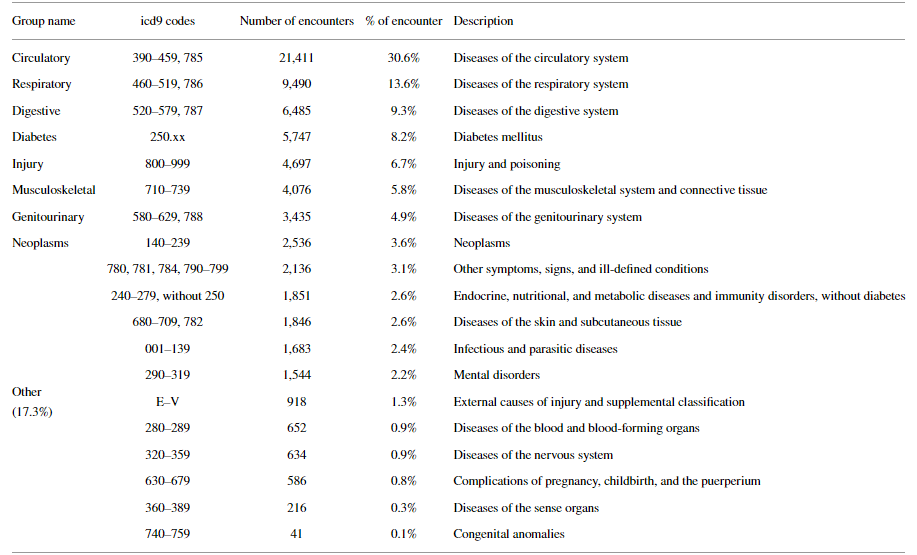

Group Names

1-Heart Conditions
2-Respiratory Conditions
3-Digestive Conditions
4-Diabetes
5-Injuries
6-Musculoskeletal Conditions
7-Genitourinary Conditions
8-Neoplasms
9-Other

In [16]:
# Heart-related conditions
circulatory_codes = [str(i) for i in list(range(390, 460)) + [785]]
data = data.replace(circulatory_codes, 'Heart Conditions')

# Respiratory conditions
respiratory_codes = [str(i) for i in list(range(460, 520)) + [786]]
data = data.replace(respiratory_codes, 'Respiratory Conditions')

# Digestive conditions
digestive_codes = [str(i) for i in list(range(520, 580)) + [787]]
data = data.replace(digestive_codes, 'Digestive Conditions')

# Diabetes
data = data.replace(regex=r'^250.*', value='Diabetes')

# Injuries
injury_codes = [str(i) for i in range(800, 1000)]
data = data.replace(injury_codes, 'Injuries')

# Musculoskeletal conditions
musculoskeletal_codes = [str(i) for i in range(710, 740)]
data = data.replace(musculoskeletal_codes, 'Musculoskeletal Conditions')

# Genitourinary conditions
genitourinary_codes = [str(i) for i in list(range(580, 630)) + [788]]
data = data.replace(genitourinary_codes, 'Genitourinary Conditions')

# Neoplasms (Tumors)
neoplasm_codes = [str(i) for i in range(140, 240)]
data = data.replace(neoplasm_codes, 'Neoplasms')

# Other conditions
data = data.replace(regex=r'^[E,V].*', value='Other')

# Unclassified
data = data.replace([str(i) for i in range(0, 1000)], 'Unclassified')


In [17]:
for i in data[['diag_1', 'diag_2', 'diag_3']]:
    print(f'{i}:\n{sorted(data[i].unique())}\n')

diag_1:
['Diabetes', 'Digestive Conditions', 'Genitourinary Conditions', 'Heart Conditions', 'Injuries', 'Musculoskeletal Conditions', 'Neoplasms', 'Other', 'Respiratory Conditions', 'Unclassified']

diag_2:
['Diabetes', 'Digestive Conditions', 'Genitourinary Conditions', 'Heart Conditions', 'Injuries', 'Musculoskeletal Conditions', 'Neoplasms', 'Other', 'Respiratory Conditions', 'Unclassified']

diag_3:
['365.44', 'Diabetes', 'Digestive Conditions', 'Genitourinary Conditions', 'Heart Conditions', 'Injuries', 'Musculoskeletal Conditions', 'Neoplasms', 'Other', 'Respiratory Conditions', 'Unclassified']



In [18]:
# add 365.44 to Other
data = data.replace('365.44', 'Other') 

In [19]:
import plotly.express as px

fig = px.line(data, x=data['diag_1'].value_counts().sort_index().index,
              y=data['diag_1'].value_counts().sort_index().values,
              markers=True, line_shape='linear', labels={'x': 'Diagnosis Code', 'y': 'Count'},
              title='Line Plot for diag_1')

fig.add_scatter(x=data['diag_2'].value_counts().sort_index().index,
                y=data['diag_2'].value_counts().sort_index().values,
                mode='lines+markers', name='diag_2')

fig.add_scatter(x=data['diag_3'].value_counts().sort_index().index,
                y=data['diag_3'].value_counts().sort_index().values,
                mode='lines+markers', name='diag_3')

fig.update_layout(title_text='Tendency in Diagnoses (diag_1, diag_2, diag_3) among Diabetic Patients',
                  xaxis_title='Diagnosis Code',
                  yaxis_title='Count',
                  legend_title='Diagnoses')

fig.show()


Observing the depicted graph, we observe a substantial correlation among the diagnoses. Consequently, we opt to exclude 'diag_2' and 'diag_3'. Moreover, given the prevalence of the most common diagnoses across all three diagnostic columns, our machine learning model will solely utilize the primary diagnosis variable for construction.

In [20]:
data = data.drop(columns=['diag_2', 'diag_3'])

### The gender column :

In [21]:
data['gender'].value_counts()

gender
Female             37383
Male               32847
Unknown/Invalid        3
Name: count, dtype: int64

We only have 3 records with 'Unknown/Invalid', we decided to exclude them from the dataset because it's minimal and doesn't provide us with any information.

In [22]:
data = data[data['gender'] != 'Unknown/Invalid']

# Data visualization

### Insulin distribution

In [23]:
fig = px.histogram(data, x='insulin', nbins=20, title='Insulin distribution')
fig.update_layout(xaxis_title='Insulin', yaxis_title='Fréquence')
fig.show()

#### Distribution of age 

In [24]:
fig = px.histogram(data, x='age', nbins=20, title='Age repartition')
fig.update_layout(xaxis_title='Âge', yaxis_title='Fréquence')
fig.show()

### Distribution of insulin by age

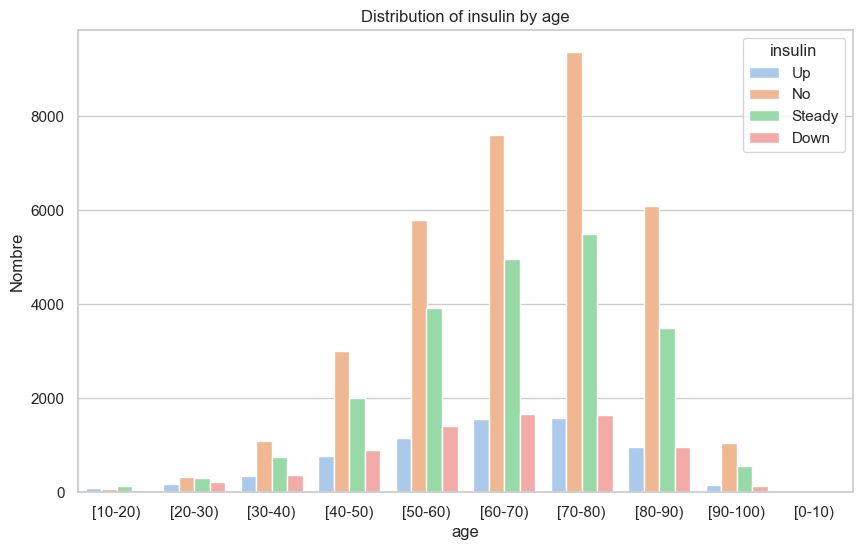

In [27]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(x='age', hue='insulin', data=data, palette='pastel')

plt.title('Distribution of insulin by age')
plt.xlabel('age')
plt.ylabel('Nombre')
plt.show()

### Distribution of race

In [28]:
race_distribution = data['race'].value_counts()
fig = px.pie(race_distribution, names=race_distribution.index, values=race_distribution.values, 
             title='Distribution of races in the dataset')
fig.show()

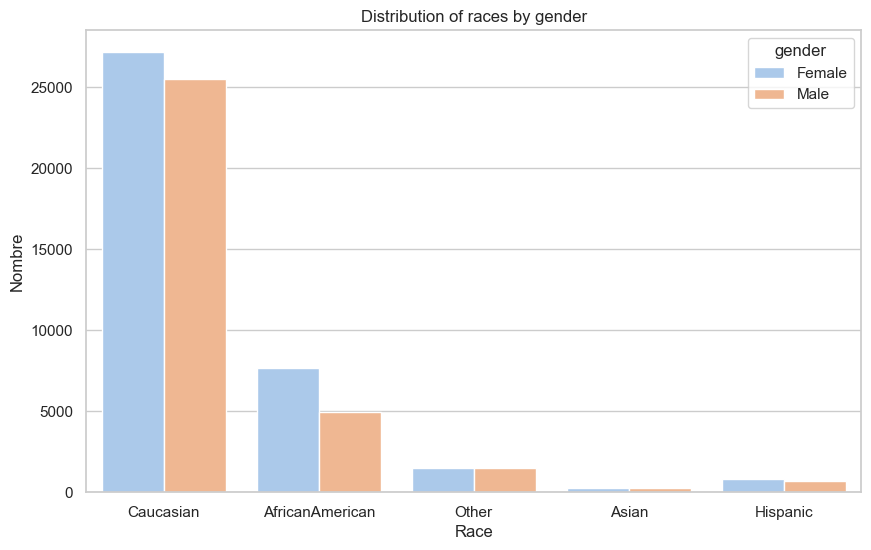

In [29]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(x='race', hue='gender', data=data, palette='pastel')
plt.title('Distribution of races by gender')
plt.xlabel('Race')
plt.ylabel('Nombre')
plt.show()

#### Distribution of insulin by race

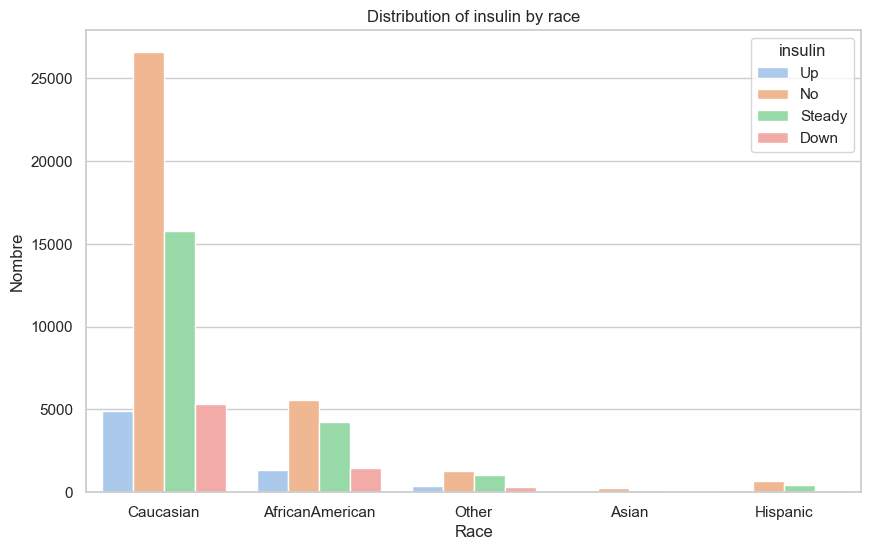

In [30]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.countplot(x='race', hue='insulin', data=data, palette='pastel')

plt.title("Distribution of insulin by race")
plt.xlabel('Race')
plt.ylabel('Nombre')
plt.show()

#### breakdown of insulin-related diagnoses

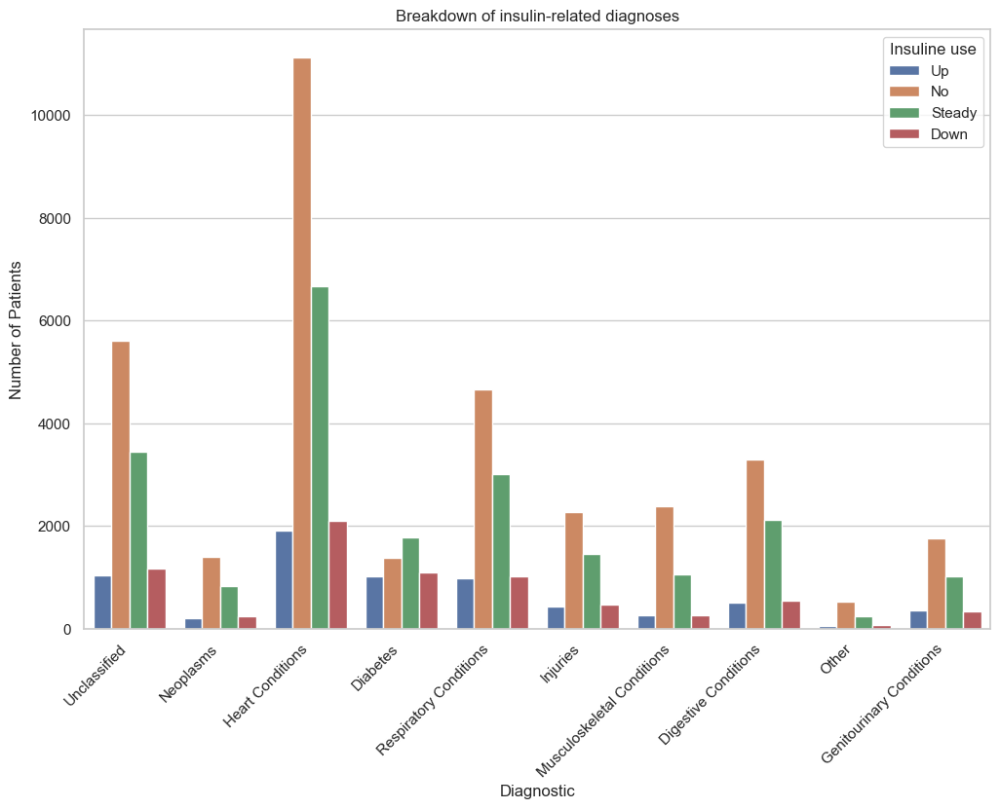

In [31]:
plt.figure(figsize=(12, 8))
sns.countplot(x='diag_1', hue='insulin', data=data)
plt.title('Breakdown of insulin-related diagnoses')
plt.xlabel('Diagnostic')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45, ha='right') 
plt.legend(title='Insuline use', loc='upper right')
plt.show()


### admission_type distribution

In [32]:
mapping_data = pd.read_csv('IDS_mapping.csv')
mapp=mapping_data.iloc[:8]
mapp['admission_type_id'] = mapp['admission_type_id'].astype(int)
merged_data = pd.merge(data, mapp, on='admission_type_id')

In [33]:
fig = px.histogram(merged_data, x='description', nbins=20, title='Admission type description')
fig.update_layout(xaxis_title='Admission type ', yaxis_title='Fréquence')
fig.show()

#### insulin distribution by admission_type

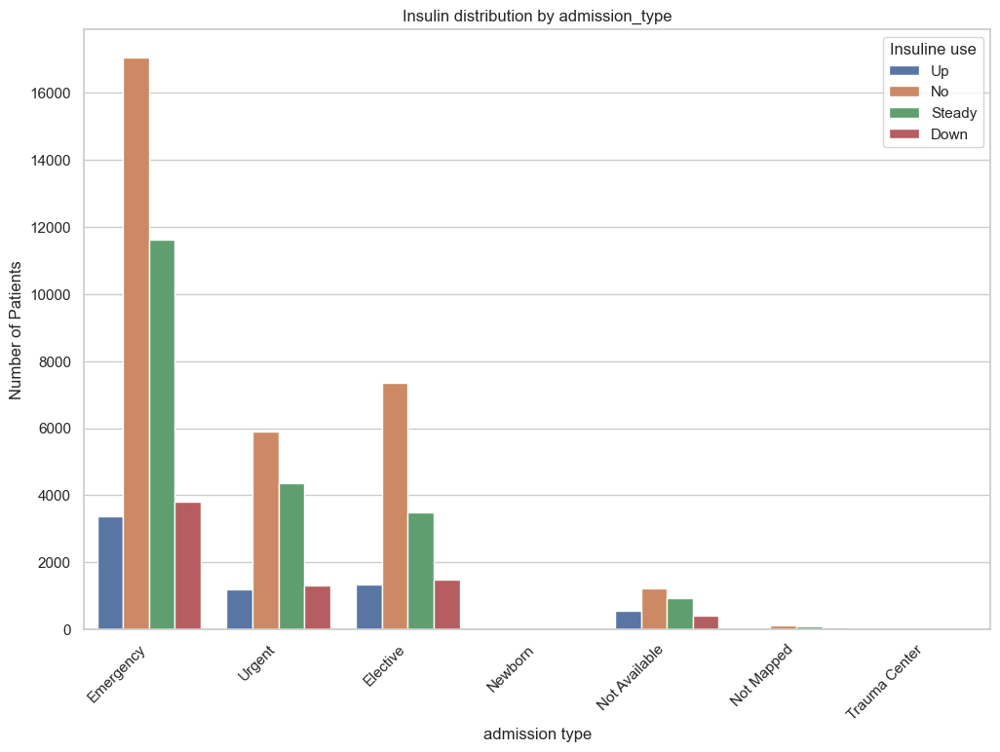

In [34]:
plt.figure(figsize=(12, 8))
sns.countplot(x='description', hue='insulin', data=merged_data)
plt.title('Insulin distribution by admission_type')
plt.xlabel('admission type')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45, ha='right') 
plt.legend(title='Insuline use', loc='upper right')
plt.show()


# <span style='color:red'>Modeling

### Coding non-numeric value?
When it comes to machine learning models, most algorithms require all input data to be numeric. Therefore, we will perform the encoding of categorical variables, including the 'insulin' column if it contains non-numeric values.
Machine learning algorithms seek to identify patterns and relationships in data. If a categorical variable is not coded, the algorithm may interpret incorrect relationships or be unable to capture significant trends.

In [35]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['race'] = label_encoder.fit_transform(data['race'])
data['gender'] = label_encoder.fit_transform(data['gender'])
data['age'] = label_encoder.fit_transform(data['age'])
data['diabetesMed'] = label_encoder.fit_transform(data['diabetesMed'])
data['change'] = label_encoder.fit_transform(data['change'])
data['diag_1'] = label_encoder.fit_transform(data['diag_1'])
data['medical_specialty'] = label_encoder.fit_transform(data['medical_specialty'])

medications = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'glipizide', \
'glyburide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'insulin', 'glyburide-metformin', \
'tolazamide','metformin-pioglitazone', 'metformin-rosiglitazone', 'glipizide-metformin','troglitazone', \
'tolbutamide', 'acetohexamide','glimepiride-pioglitazone','diag_1']

#Assign a value of 1 to records where a medication has been prescribed, and set it as 0 if there was no medication prescribed.

for col in medications:
    data[col] = data[col].replace('No', 0)
    data[col] = data[col].replace('Steady', 1)
    data[col] = data[col].replace('Up', 1)
    data[col] = data[col].replace('Down', 1)
    
data['readmitted'] = data['readmitted'].replace('<30', 1)
data['readmitted'] = data['readmitted'].replace('>30', 0)
data['readmitted'] = data['readmitted'].replace('NO', 0)    

In [36]:
data.head()

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,medical_specialty,...,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,149190,55629189,2,0,1,1,1,7,3,67,...,0,1,0,0,0,0,0,0,1,0
1,64410,86047875,0,0,2,1,1,7,2,67,...,0,0,0,0,0,0,0,1,1,0
2,500364,82442376,2,1,3,1,1,7,2,67,...,0,1,0,0,0,0,0,0,1,0
3,16680,42519267,2,1,4,1,1,7,1,67,...,0,1,0,0,0,0,0,0,1,0
4,35754,82637451,2,1,5,2,1,2,3,67,...,0,1,0,0,0,0,0,1,1,0


In [37]:
# Number of row and column
print(f'Number of rows: {len(data)}, Number of columns: {len(data.columns)}')

Number of rows: 70230, Number of columns: 42


### Train Test split

The training-test separation is an important step in machine learning for evaluating the performance of a predictive model. 
It enables us to assess how well the model is likely to perform on new and unseen data. The aim is to build a model that generalizes well, not only to the data on which it has been trained, but also to new data.
we took 20% of the data as test data and the remaining 80% as training data

In [38]:
features = ['race', 'gender','age','admission_type_id','time_in_hospital', 'discharge_disposition_id',
'admission_source_id','metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',\
'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', \
'acarbose', 'miglitol', 'troglitazone', 'tolazamide', 'glyburide-metformin', 'glipizide-metformin',\
'metformin-rosiglitazone', 'metformin-pioglitazone', 'change', 'diabetesMed']

**<span style='color:red'> As the dataset is very large (70K records), it takes us far too long to run. We decided to use 10k records to reduce runtime. </span>**

In [39]:
from sklearn.model_selection import train_test_split
data=data[:10000]
x = data[features]
y = data['insulin']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=4)

### Standardisation?
Data standardization, usually performed with StandardScaler in scikit-learn, is often an important step in data pre-processing, especially when using algorithms that are sensitive to feature scaling.

## RandomForestClassifier
RandomForestClassifier is an ensemble learning method used for both classification and regression tasks. It belongs to the family of tree-based models and is an extension of decision trees. The "forest" in its name comes from the idea that it builds multiple decision trees and merges them together to get a more accurate and stable prediction.

In [40]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestClassifier()) 
])

#trainning
pipeline.fit(x_train, y_train)

# prediction
predictions = pipeline.predict(x_test)

# evaluation
precision_rf = precision_score(y_test, predictions)
recall_rf = recall_score(y_test, predictions)
f1_rf = f1_score(y_test, predictions)

# printing scores
print(f'Precision: {precision_rf:.2f}')
print(f'Recall: {recall_rf:.2f}')
print(f'F1-Score: {f1_rf:.2f}')

Precision: 0.89
Recall: 0.94
F1-Score: 0.92


## Logistic regression
Logistic Regression is a statistical method used for binary classification, predicting the probability that an instance belongs to a particular category. Despite its name, it is commonly used for classification rather than regression tasks. Logistic Regression models the relationship between one or more independent variables and the probability of a particular outcome occurring.

In [41]:
from sklearn.linear_model import LogisticRegression
pipeline = Pipeline([
    ('scaler', StandardScaler()),  
    ('model', LogisticRegression()) 
])

# trainning
pipeline.fit(x_train, y_train)

# Prediction
predictions = pipeline.predict(x_test)

# evaluation
precision_lr = precision_score(y_test, predictions)
recall_lr = recall_score(y_test, predictions)
f1_lr = f1_score(y_test, predictions)

# printing
print(f'Precision: {precision_lr:.2f}')
print(f'Recall: {recall_lr:.2f}')
print(f'F1-Score: {f1_lr:.2f}')

Precision: 0.93
Recall: 0.91
F1-Score: 0.92


## Decision trees
A Decision Tree is a supervised machine learning algorithm used for both classification and regression tasks. It works by recursively partitioning the input space into regions and assigning a label or value to each region based on the majority class or average value of the instances within that region. Decision Trees are popular for their simplicity, interpretability, and ability to handle both numerical and categorical data.

In [42]:
from sklearn.tree import DecisionTreeClassifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),  
    ('model', DecisionTreeClassifier())  
])

# trainning
pipeline.fit(x_train, y_train)

# Prediction
predictions = pipeline.predict(x_test)

# evaluation
precision_dt = precision_score(y_test, predictions)
recall_dt = recall_score(y_test, predictions)
f1_dt = f1_score(y_test, predictions)

# printing scores
print(f'Precision: {precision_dt:.2f}')
print(f'Recall: {recall_dt:.2f}')
print(f'F1-Score: {f1_dt:.2f}')

Precision: 0.90
Recall: 0.88
F1-Score: 0.89


## Neural networks
A neural network, also known as an artificial neural network (ANN) or simply a neural net, is a computational model inspired by the way biological neural networks in the human brain operate. It is a fundamental component of machine learning and artificial intelligence. Neural networks are used for various tasks, including pattern recognition, classification, regression, and decision-making.

In [43]:
from sklearn.neural_network import MLPClassifier
pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('model', MLPClassifier()) 
])

# trainning
pipeline.fit(x_train, y_train)

# Prediction
predictions = pipeline.predict(x_test)

# evaluation
precision_nn = precision_score(y_test, predictions)
recall_nn = recall_score(y_test, predictions)
f1_nn = f1_score(y_test, predictions)

# printing scores
print(f'Precision: {precision_nn:.2f}')
print(f'Recall: {recall_nn:.2f}')
print(f'F1-Score: {f1_nn:.2f}')

Precision: 0.90
Recall: 0.94
F1-Score: 0.92


## SVM (Support Vector Machines)
Support Vector Machine (SVM) is a supervised machine learning algorithm used for classification and regression tasks.

In [44]:
from sklearn.svm import SVC
pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('model', SVC())  
])

# trainning
pipeline.fit(x_train, y_train)

# Prediction
predictions = pipeline.predict(x_test)

# evaluation
precision_svm = precision_score(y_test, predictions)
recall_svm = recall_score(y_test, predictions)
f1_svm = f1_score(y_test, predictions)

# printing scores
print(f'Precision: {precision_svm:.2f}')
print(f'Recall: {recall_svm:.2f}')
print(f'F1-Score: {f1_svm:.2f}')

Precision: 0.93
Recall: 0.90
F1-Score: 0.92


In [45]:
import plotly.graph_objects as go

# Lists of metrics for each model
models = ['Random Forest', 'Logistic Regression', 'Decision Trees', 'Neural Networks', 'SVM']
precision_scores = [precision_rf, precision_lr, precision_dt, precision_nn, precision_svm]
recall_scores = [recall_rf, recall_lr, recall_dt, recall_nn, recall_svm]
f1_scores = [f1_rf, f1_lr, f1_dt, f1_nn, f1_svm]

# Round values to two digits after the decimal point
precision_scores = [round(score, 2) for score in precision_scores]
recall_scores = [round(score, 2) for score in recall_scores]
f1_scores = [round(score, 2) for score in f1_scores]

# Creating traces for each metric
trace_precision = go.Bar(x=models, y=precision_scores, name='Precision', text=precision_scores, textposition='auto')
trace_recall = go.Bar(x=models, y=recall_scores, name='Recall', text=recall_scores, textposition='auto')
trace_f1 = go.Bar(x=models, y=f1_scores, name='F1-Score', text=f1_scores, textposition='auto')

# Creating the figure
fig = go.Figure(data=[trace_precision, trace_recall, trace_f1])

# Formatting the figure
fig.update_layout(
    barmode='group',
    title='Performances des modèles',
    xaxis=dict(title='Modèles'),
    yaxis=dict(title='Scores'),
)

fig.show()


# Interpretation, overfitting??
Overall, the results show that all the classification models we tested (RandomForest, Logistic Regression, Decision Trees, Neural Networks, SVM) perform exceptionally well in predicting insulin use, with precision, recall and F1-Score all reaching 91% or more.
This may suggest excellent adaptation to training data. However, it's important to note that overly high performance, such as perfect accuracy, could be indicative of overfitting. Overfitting occurs when the model fits the specific training data too closely, even capturing noise in the data, but does not generalize well to new data sets.

To assess the generalizability of our models, we'll perform cross-validation. Cross-validation involves dividing the dataset into several folds and evaluating the model on different combinations of training and test sets. This will enable us to check whether our models maintain a high performance on different datasets, which would indicate a good generalization capability despite the initial accuracy results.

In [46]:
# Our models:
models = {
    'RandomForest': make_pipeline(StandardScaler(),RandomForestClassifier()),
    'LogisticRegression': make_pipeline(StandardScaler(), LogisticRegression()),
    'DecisionTree': make_pipeline(StandardScaler(),DecisionTreeClassifier()),
    'NeuralNetwork': make_pipeline(StandardScaler(), MLPClassifier()),
    'SVM': make_pipeline(StandardScaler(), SVC())
}

# Loop through each model and perform cross-validation
for model_name, model in models.items():
    scores = cross_val_score(model, x, y, cv=5, scoring='accuracy')  
    print(f'{model_name} - Cross-Validation Scores: {scores}')
    print(f'{model_name} - Mean Accuracy: {np.mean(scores):.2f}\n')


RandomForest - Cross-Validation Scores: [0.912  0.9105 0.919  0.9285 0.9235]
RandomForest - Mean Accuracy: 0.92

LogisticRegression - Cross-Validation Scores: [0.899  0.9295 0.931  0.9195 0.9275]
LogisticRegression - Mean Accuracy: 0.92

DecisionTree - Cross-Validation Scores: [0.9015 0.901  0.9015 0.908  0.914 ]
DecisionTree - Mean Accuracy: 0.91

NeuralNetwork - Cross-Validation Scores: [0.9225 0.925  0.925  0.93   0.932 ]
NeuralNetwork - Mean Accuracy: 0.93

SVM - Cross-Validation Scores: [0.9145 0.921  0.9305 0.91   0.9275]
SVM - Mean Accuracy: 0.92



## Interpretation

Cross-validation results provide a more robust assessment of model performance, taking into account different subdivisions of the dataset. 

**RandomForest**: The average accuracy of 0.92 indicates good overall performance, with consistent stability across the different folds of the cross-validation.

**Logistic Regression**: Average scores of 0.92 suggest solid, consistent performance for logistic regression across the different data sets.

**Decision Tree**: Although slightly lower, with an average score of 0.91, the performance of the decision tree model remains reasonable and stable.

**Neural Network**: The neural network has an average accuracy of 0.93, indicating high and stable performance on different subdivisions of the dataset.

**SVM (Support Vector Machines)**: With an average accuracy of 0.92, the SVM shows robust and consistent performance, suggesting good generalization capability.

Overall, all models appear to generalize well over different portions of the dataset, which is a positive indicator.

## Grid Search with Neural Network
After conducting a thorough performance evaluation of various machine learning models, the Neural Network demonstrated commendable precision, recall, and F1-score. Additionally, it exhibited robust generalization capabilities during cross-validation. The Neural Network's adaptability and promising performance make it an attractive option for further exploration.

The decision to proceed with the Neural Network is motivated by its favorable evaluation metrics and the potential for enhancing its performance through hyperparameter tuning. In this pursuit, a grid search will be employed to systematically explore different combinations of hyperparameters, aiming to discover the optimal configuration for maximizing the Neural Network's effectiveness in the given classification task.

## explanation of hyperparameters

### hidden_layer_sizes:
This hyperparameter determines the number of neurons in each hidden layer of the neural network.
In the provided grid, three different configurations are tested: one with 50 neurons, one with 100 neurons, and another with 150 neurons.
Each configuration represents a different neural network architecture, allowing the grid search to explore how the number of neurons in the hidden layers affects model performance.

### activation:
The activation function is used to introduce non-linearity to the model.
Two different activation functions are considered in the grid search: 'relu' (Rectified Linear Unit) and 'tanh' (hyperbolic tangent).
Each activation function has different properties, and testing both allows the grid search to determine which one works better for the given dataset.

### alpha:
Alpha is the regularization parameter for the MLP model. It helps prevent overfitting by penalizing large coefficients.
Three different values are tested in the grid search: 0.0001, 0.001, and 0.01.
Varying alpha values enable the grid search to explore the trade-off between fitting the training data well and preventing overfitting.

In [47]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

mlp_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPClassifier())
])

#hyperparameter grid
mlp_param_grid = {
    'model__hidden_layer_sizes': [(50,),(100,),(150,)], 
    'model__activation': ['relu', 'tanh'],
    'model__alpha': [0.0001, 0.001, 0.01]
}

# Creating the GridSearchCV object
mlp_grid_search = GridSearchCV(mlp_pipeline, mlp_param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Search for the best hyperparameter combinations
mlp_grid_search.fit(x_train, y_train)

#  Displaying the best hyperparameters
print("Best hyperparameters for MLPClassifier:", mlp_grid_search.best_params_)

# Prediction on test set with best hyperparameters
mlp_y_pred = mlp_grid_search.predict(x_test)

# Model performance evaluation
mlp_accuracy = mlp_grid_search.score(x_test, y_test)
print(f'MLPClassifier model accuracy with improved hyperparameters: {mlp_accuracy*100:.2f}%')


Best hyperparameters for MLPClassifier: {'model__activation': 'relu', 'model__alpha': 0.01, 'model__hidden_layer_sizes': (50,)}
MLPClassifier model accuracy with improved hyperparameters: 93.55%


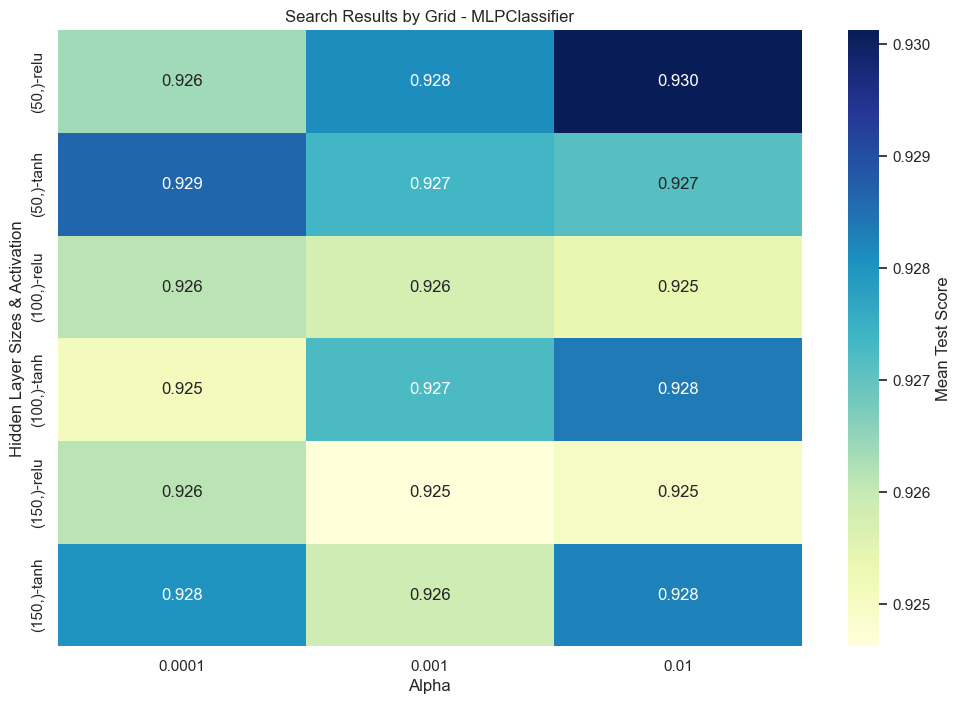

In [48]:
# Retrieving grid search results for MLPClassifier
mlp_results = mlp_grid_search.cv_results_

# Creation of a DataFrame with results for MLPClassifier
df_mlp_results = pd.DataFrame(mlp_results)

# Selection of relevant columns
mlp_columns = ['param_model__hidden_layer_sizes', 'param_model__activation', 'param_model__alpha', 'mean_test_score']
df_mlp_results = df_mlp_results[mlp_columns]

# Pivoting the DataFrame to prepare data for the heatmap
df_mlp_pivot = df_mlp_results.pivot_table(index=['param_model__hidden_layer_sizes', 'param_model__activation'],
                                          columns='param_model__alpha',
                                          values='mean_test_score')
# Creating the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df_mlp_pivot, annot=True, fmt=".3f", cmap="YlGnBu", cbar_kws={'label': 'Mean Test Score'})
plt.title('Search Results by Grid - MLPClassifier')
plt.xlabel('Alpha')
plt.ylabel('Hidden Layer Sizes & Activation')
plt.show()

# Conlusion
In conclusion, our machine learning models, particularly the Neural Networks model with refined hyperparameters, exhibit significant potential for accurately predicting insulin usage in diverse medical scenarios. Nevertheless, ongoing vigilance for overfitting and continuous validation on new datasets remains essential for ensuring the reliability and applicability of these models in real-world healthcare settings.





